In [1]:
import pandas as pd
import datetime as dt
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from DLTV import df_donantes, df_transacciones, df_inflacion, lfv, donaciones_anuales
from xgboost import XGBClassifier, plot_importance
import gower
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import matplotlib.pyplot as plt
from kmodes.kprototypes import KPrototypes
from pca import pca
from sklearn.preprocessing import StandardScaler

c:\Users\ZU956KH\OneDrive - EY\Documents\Compartamos\CompartamosAI\Funciones_DLTV.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['VL_Lifespan'] = 1/df['VL_NChurn']


### Funciones de Experimentación

In [2]:
def obtener_mejor_k(df: pd.DataFrame):
    """ Calcula el mejor número de clusters para un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
    Returns:
        int: Número de clusters óptimo"""
    df = StandardScaler().fit_transform(df)
    sil = []
    for k in range(2, 10):
        kmeans = KMeans(n_clusters = k, random_state=123).fit(df)
        labels = kmeans.labels_
        sil.append(silhouette_score(df, labels, metric = 'euclidean'))
    # Graficar silhouette_score
    fig = px.line(x = range(2, 10), y = sil)
    fig.show()
    # Crear dataframe con los valores de silhouette_score
    df_sil = pd.DataFrame({'k': range(2, 10), 'sil': sil})
    # Ordenar de mayor a menor
    df_sil = df_sil.sort_values('sil', ascending = False)
    # Obtener el mejor k
    best_k = df_sil.iloc[0, 0]
    # Si best_k = 2, tomar el segundo mejor
    if best_k == 2:
        best_k = df_sil.iloc[1, 0]
    
    print('El mejor número de clusters es: ', best_k)
    return best_k

def obtener_mejor_k_prototype(df: pd.DataFrame):
    """ Calcula el mejor número de clusters para un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
    Returns:
        None"""
    # Convertir dataframe en array
    array = df.values    

    # Obtener índices de variables categóricas
    idx = []
    for col in df.columns:
        if df[col].dtype == 'object':
            idx.append(df.columns.get_loc(col))
        else:
            array[:,df.columns.get_loc(col)] = array[:,df.columns.get_loc(col)].astype(float)

    # Calcular silhouette_score
    cost_values = []
    for k in range(2, 10):
        kprototypes = KPrototypes(n_clusters=k, init='Huang', verbose=1, max_iter=20, random_state=123)
        kprototypes.fit_predict(array, categorical=idx)
        cost_values.append(kprototypes.cost_)
    # Graficar elbow
    fig = px.line(x = range(2, 10), y = cost_values, title='Gráfica de codo')
    fig.update_xaxes(title='Número de clusters')
    fig.update_yaxes(title='Costo')
    fig.show()

def obtener_clusters_prototype(df: pd.DataFrame, cols: list, k: int):
    """ Calcula los clusters de un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
        k (int): Número de clusters
    Returns:
        DataFrame: Dataset con los clusters
        KMeans: Modelo de KMeans"""
    # Convertir dataframe en array
    array = df.values    

    # Obtener índices de variables categóricas
    idx = []
    for col in df.columns:
        if df[col].dtype == 'object':
            idx.append(df.columns.get_loc(col))
        else:
            array[:,df.columns.get_loc(col)] = array[:,df.columns.get_loc(col)].astype(float)

    # Calcular clusters
    kprototypes = KPrototypes(n_clusters=k, init='Huang', verbose=1, max_iter=20, random_state=123)
    clusters = kprototypes.fit_predict(array, categorical=idx)
    df['cluster'] = clusters
    return df, kprototypes

def obtener_clusters(df:pd.DataFrame, cols: list, k: int):
    """ Calcula los clusters de un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
        k (int): Número de clusters
    Returns:
        DataFrame: Dataset con los clusters
        KMeans: Modelo de KMeans"""
    df_copy = df[cols].copy()
    df_copy = StandardScaler().fit_transform(df_copy)
    kmeans = KMeans(n_clusters = k, n_init=10, random_state=0)
    kmeans.fit(df_copy)
    df['cluster'] = kmeans.labels_
    return df, kmeans

def graficar_clusters(df: pd.DataFrame, x: str, y: str):
    """ Grafica los clusters de un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
        x (str): Nombre de la columna x
        y (str): Nombre de la columna y
    Returns:
        None"""
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(df[x], df[y], c=df['cluster'], cmap='rainbow')
    ax.set_xlabel(x)
    ax.set_ylabel(y)
    plt.show()

def graficar_clusters3D(df: pd.DataFrame, x:str, y:str, z:str):
    """ Grafica los clusters de un dataset dado en 3D
    Args:
        df (DataFrame): Dataset a utilizar
        x (str): Nombre de la columna x
        y (str): Nombre de la columna y
        z (str): Nombre de la columna z
    Returns:
        None"""
    fig = px.scatter_3d(df, x=x, y=y, z=z, color='cluster')
    fig.show()

def graficar_importancia(df: pd.DataFrame, cols: list):
    """ Grafica la importancia de las variables de un dataset dado
    Args:
        df (DataFrame): Dataset a utilizar
        cols (list): Lista de columnas a utilizar
    Returns:
        None"""
    # Crear conjunto de entrenamiento y prueba
    X = df[cols]
    y = df['cluster']

    # Divider en datos de prueba y entrenamiento
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
    model = XGBClassifier(eval_metric='mlogloss')
    # Entrenar modelo
    model.fit(X_train, y_train)
    # Predecir con datos de prueba
    y_pred = model.predict(X_test)
    # Calcular precisión del modelo
    accuracy = accuracy_score(y_test, y_pred)
    print(f'La precisión del modelo es: {accuracy}')
    # Graficar importancia de variables
    plot_importance(model)

def graficar(df: pd.DataFrame, cols: list):
    if len(cols) == 2:
        graficar_clusters(df, cols[1], cols[0])
    elif len(cols) == 3:
        graficar_clusters3D(df, cols[0], cols[1], cols[2])
    else:
        print('No se puede graficar porque son más de 3 dimensiones')

def calcular_outliers(df: pd.DataFrame, col:str):
    """ Calcula los outliers de una variable
    Args:
        df (DataFrame): Dataset a utilizar
        col (str): Nombre de la columna
    Returns:
        DataFrame: Dataset sin outliers
        DataFrame: Dataset con outliers"""
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    no_outliers = df[(df[col] >= lower) & (df[col] <= upper)]
    print(f'Se encontraron {len(outliers)} outliers en la variable {col} con un límite inferior de {lower} y un límite superior de {upper}')
    print(f'Se analizará una base con {len(no_outliers)} registros')
    return no_outliers, outliers

#### Agregar Variables

In [3]:
# Pasar columnas de fecha a formato fecha
df_donantes['DT_Captacion'] = pd.to_datetime(df_donantes['DT_Captacion'])
df_donantes['DT_Primer_Cobro'] = pd.to_datetime(df_donantes['DT_Primer_Cobro'])
# Calcular el tiempo de conversión como la diferencia entre la fecha de primer cobro y la fecha de captación
df_donantes['T_Conversion'] = df_donantes['DT_Primer_Cobro'] - df_donantes['DT_Captacion']
# Convertir el tiempo de conversión a número de días
df_donantes['T_Conversion'] = df_donantes['T_Conversion'].dt.days
# Hacer una tabla dinámica que muestre por donante en qué canal entró su donación
tipo_transacciones = df_transacciones.pivot_table(index='FK_ID_Donante', columns='FK_CD_Registro', values='VL_Importe', aggfunc='count').fillna(0)
# Calcular el número de canales por donante
tipo_transacciones['Canales_Donacion'] = tipo_transacciones.apply(lambda x: np.count_nonzero(x), axis=1)
# Calcular el canal principal de donación
tipo_transacciones['Canal_Principal'] = tipo_transacciones.apply(lambda x: x.idxmax(), axis=1)
# Agregar variables a la tabla de donantes
lfv = pd.merge(lfv, df_donantes[['ID_Donante', 'T_Conversion', 'FK_ID_Genero', 'FK_ID_Estado_Civil']], on='ID_Donante', how='left')
lfv = pd.merge(lfv, tipo_transacciones[['Canales_Donacion', 'Canal_Principal']], left_on='ID_Donante', right_on= 'FK_ID_Donante', how='left')
lfv.head()

,ID_Donante,Valor_Total,Anio_Donacion,VL_Lifespan,VL_Edad,VL_NChurn,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,Ant_Primer_Transaccion,Total_Anual,DLTV,T_Conversion,FK_ID_Genero,FK_ID_Estado_Civil,Canales_Donacion,Canal_Principal
0,1020000012,1.828684e+06,2021,6.250000,55,0.1600,68.000000,9.666667,2,609561.436663,2.456657e+06,3993,Masculino,0,1,DI - Regular
1,1020000038,1.689828e+06,2021,4.545455,19,0.2200,24.333333,4.000000,2,563275.901847,1.685644e+06,3129,Femenino,0,1,DI - Regular
2,1020000079,2.711845e+06,2021,5.555556,63,0.1800,20.333333,1.500000,2,903948.331844,3.202134e+06,3014,Masculino,Casado,1,DI - Regular
3,1020000087,1.005497e+06,2021,7.142857,67,0.1400,34.000000,4.166667,2,335165.603701,1.495850e+06,2794,Masculino,0,1,DI - Regular
4,1020000095,2.231845e+06,2021,1.670844,49,0.5985,26.750000,20.000000,2,743948.331844,6.600637e+05,5814,Femenino,Casado,1,PI - Padrinazgo individual


In [4]:
efect_cobro = df_transacciones.pivot_table(index='FK_ID_Donante', columns='FK_CD_Etapa', values='VL_Importe', aggfunc='count').fillna(0)
efect_cobro.head()

FK_CD_Etapa,Cobrada
FK_ID_Donante,
1020000012,28
1020000038,31
1020000079,31
1020000087,31
1020000095,25


#### Calcular outliers

In [5]:
# Calcular el rango IQR para la variable DLTV
donaciones_sin_outlier, outliers = calcular_outliers(lfv, 'DLTV')
donaciones_sin_outlier.head()


Se encontraron 1293 outliers en la variable DLTV con un límite inferior de -834150.2522626003 y un límite superior de 2030440.2688611895
Se analizará una base con 22902 registros


,ID_Donante,Valor_Total,Anio_Donacion,VL_Lifespan,VL_Edad,VL_NChurn,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,Ant_Primer_Transaccion,Total_Anual,DLTV,T_Conversion,FK_ID_Genero,FK_ID_Estado_Civil,Canales_Donacion,Canal_Principal
1,1020000038,1.689828e+06,2021,4.545455,19,0.2200,24.333333,4.000000,2,563275.901847,1.685644e+06,3129,Femenino,0,1,DI - Regular
3,1020000087,1.005497e+06,2021,7.142857,67,0.1400,34.000000,4.166667,2,335165.603701,1.495850e+06,2794,Masculino,0,1,DI - Regular
4,1020000095,2.231845e+06,2021,1.670844,49,0.5985,26.750000,20.000000,2,743948.331844,6.600637e+05,5814,Femenino,Casado,1,PI - Padrinazgo individual
5,1020000152,4.789785e+05,2021,1.715266,71,0.5830,19.333333,2.111111,2,159659.492776,1.416569e+05,1727,Femenino,Soltero,1,DI - Regular
6,1020000160,5.234709e+05,2021,4.347826,75,0.2300,25.555556,2.555556,2,174490.312221,5.221749e+05,1727,Femenino,0,1,DI - Regular


#### Definición de variables a utilizar

In [6]:
# Variables a evaluar
model_cols = ['VL_Edad', 'Prom_Cuotas_Pagadas', 'Prom_Cuotas_No_Pagadas', 'Canales_Donacion', 'DLTV', 'VL_NChurn']

# Estandarizar variables
scaler = StandardScaler()
scaler.fit(donaciones_sin_outlier[model_cols])
donaciones_sin_outlier[model_cols] = scaler.transform(donaciones_sin_outlier[model_cols])

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_7764\102592232.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  donaciones_sin_outlier[model_cols] = scaler.transform(donaciones_sin_outlier[model_cols])


#### PCA

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Hex [[0, 0, 0]] should be of type string
[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


,VL_Edad,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,Canales_Donacion,DLTV,VL_NChurn
PC1,0.184869,0.351480,0.125476,-0.003636,0.655654,-0.629798
PC2,0.500416,0.579437,0.505849,-0.014188,-0.261167,0.299239
PC3,-0.270189,0.023224,0.274688,0.922300,0.018979,0.002811


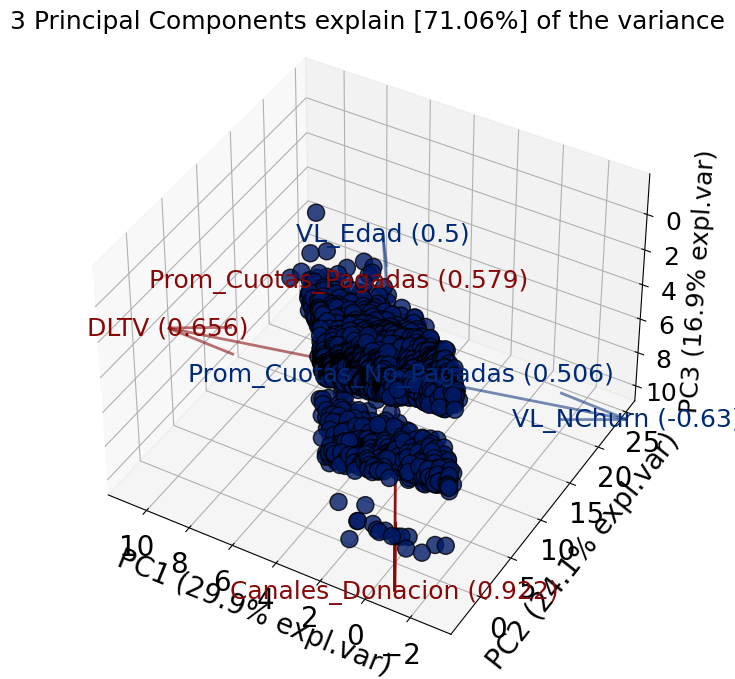

In [85]:
# Inicializar objeto PCA
pca_model = pca(n_components=3)
pca_donantes = pca_model.fit_transform(donaciones_sin_outlier[model_cols])

# Creamos el biplot
fig, ax = pca_model.biplot3d(n_feat=8, legend=False, figsize=(8,8))

display(pca_donantes['loadings'])

In [86]:
df_pca = pca_donantes['PC']
df_pca = pd.DataFrame(df_pca)
df_pca = df_pca.rename(columns={'PC1':'DV-Fuga', 'PC2':'Edad-Cuotas', 'PC3':'Canales_Donacion'})
df_pca.head()

,DV-Fuga,Edad-Cuotas,Canales_Donacion
1,2.635984,0.144784,0.643517
3,3.936229,3.252972,-0.429284
4,1.545443,4.916317,1.142240
5,0.130101,2.844601,-0.789618
6,1.934578,3.128615,-0.811460


#### K-Prototypes (Para datasets con variables categóricas y numéricas al tiempo)

In [77]:
model_cols = ['DLTV', 'FK_ID_Genero', 'Canal_Principal']
obtener_mejor_k_prototype(donaciones_sin_outlier[model_cols])

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/20, moves: 1836, ncost: 12421.592213988313
Run: 1, iteration: 2/20, moves: 385, ncost: 12401.283468432744
Run: 1, iteration: 3/20, moves: 38, ncost: 12401.029351380235
Run: 1, iteration: 4/20, moves: 7, ncost: 12401.022131082313
Run: 1, iteration: 5/20, moves: 1, ncost: 12401.021946527944
Run: 1, iteration: 6/20, moves: 0, ncost: 12401.021946527944
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/20, moves: 5689, ncost: 13624.779582502973
Run: 2, iteration: 2/20, moves: 2803, ncost: 12470.249541740726
Run: 2, iteration: 3/20, moves: 712, ncost: 12402.097480808889
Run: 2, iteration: 4/20, moves: 80, ncost: 12401.041356365127
Run: 2, iteration: 5/20, moves: 12, ncost: 12401.02213108245
Run: 2, iteration: 6/20, moves: 1, ncost: 12401.021946527402
Run: 2, iteration: 7/20, moves: 0, ncost: 12401.021946527402
Init: initializing centroids
Ini

In [78]:
best_k = 4
df_segmentado, kprototypes = obtener_clusters_prototype(donaciones_sin_outlier, model_cols, best_k)
graficar(df_segmentado, model_cols)

Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/20, moves: 4700, ncost: 1725535799053659.2
Run: 1, iteration: 2/20, moves: 3930, ncost: 1317526404132458.8
Run: 1, iteration: 3/20, moves: 3207, ncost: 1155607489798744.5
Run: 1, iteration: 4/20, moves: 867, ncost: 1137906731239205.2
Run: 1, iteration: 5/20, moves: 182, ncost: 1137181027181329.2
Run: 1, iteration: 6/20, moves: 32, ncost: 1137163489702655.8
Run: 1, iteration: 7/20, moves: 5, ncost: 1137163238187230.5
Run: 1, iteration: 8/20, moves: 2, ncost: 1137163109967017.2
Run: 1, iteration: 9/20, moves: 0, ncost: 1137163109967017.2
Init: initializing centroids
Init: initializing clusters
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/20, moves: 10961, ncost: 1400435946331054.8
Run: 2, iteration: 2/20, moves: 2478, ncost: 1318643205268369.2
Run: 2, iteration: 3/20, moves: 22

/var/folders/xq/zz5zb6z90_73_lf9wzs007h40000gn/T/ipykernel_48965/1977072918.py:80: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Gower para valores categoricos

In [8]:
gower_dist = gower.gower_matrix(donaciones_sin_outlier[model_cols])
gower_dist = pd.DataFrame(gower_dist)
gower_dist.head()

,0,1,2,3,4,5,6,7,8,9,...,22831,22832,22833,22834,22835,22836,22837,22838,22839,22840
0,0.000000,0.364548,0.502008,0.253936,0.191353,0.342369,0.055447,0.149456,0.056446,0.464625,...,0.420667,0.595975,0.481410,0.238550,0.481160,0.203047,0.147824,0.200765,0.482526,0.545861
1,0.364548,0.000000,0.804127,0.556055,0.493472,0.706917,0.357565,0.451575,0.420994,0.100077,...,0.722785,0.898094,0.783528,0.540669,0.783278,0.505165,0.449943,0.502883,0.784644,0.847979
2,0.502008,0.804127,0.000000,0.418595,0.356012,0.177711,0.446562,0.352552,0.558455,0.704050,...,0.081342,0.093967,0.020598,0.403208,0.020849,0.367705,0.354184,0.365423,0.019483,0.377186
3,0.253936,0.556055,0.418595,0.000000,0.062583,0.596305,0.198490,0.104480,0.310383,0.455978,...,0.499936,0.342039,0.439193,0.015386,0.439443,0.050890,0.106112,0.053172,0.438077,0.374742
4,0.191353,0.493472,0.356012,0.062583,0.000000,0.533722,0.135907,0.041897,0.247799,0.393395,...,0.437353,0.404622,0.376610,0.047197,0.376860,0.011693,0.043529,0.009411,0.375494,0.354508


#### Cluster Jerárquico

In [10]:
Z = linkage(gower_dist, method='average', metric='euclidean')
clusters = fcluster(Z, 4, criterion='maxclust')


C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_13092\3795057130.py:1: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



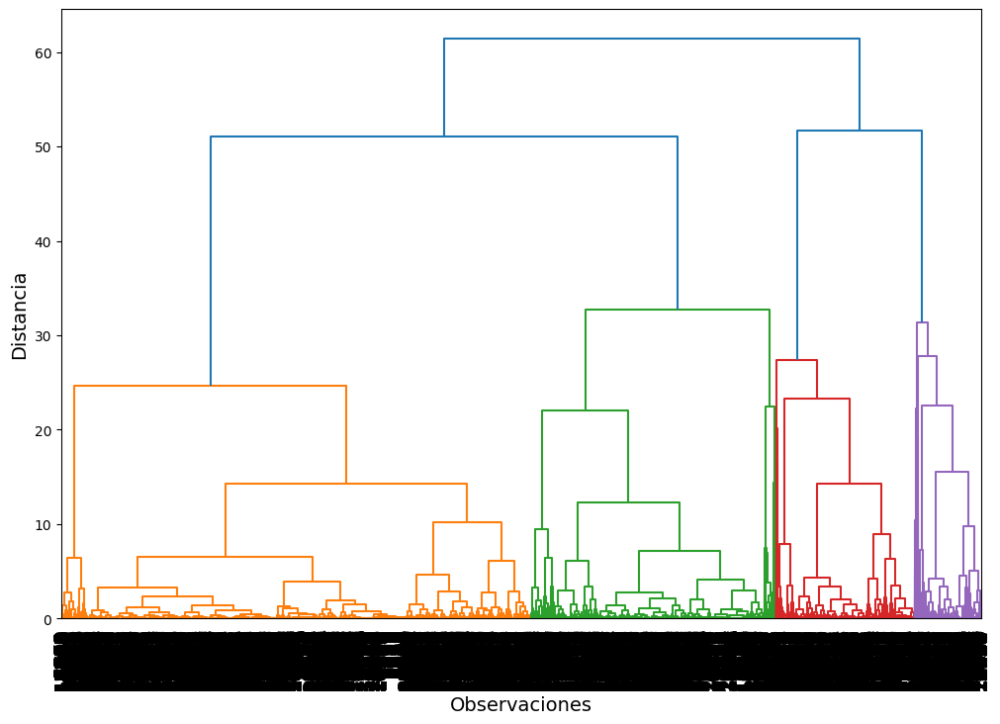

In [11]:
fig, ax = plt.subplots(figsize=(12, 8))
d = dendrogram(Z, show_leaf_counts=True, leaf_font_size=14, ax=ax)
ax.set_xlabel('Observaciones', fontsize=14)
ax.set_yticks(np.arange(0,70,10))
ax.set_ylabel('Distancia', fontsize=14)
plt.show()

In [12]:
donaciones_sin_outlier['cluster'] = clusters

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_13092\3071126646.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
graficar(donaciones_sin_outlier, model_cols)

#### Calcular número de segmentos (K-Means)

In [79]:
# Calcular los k segmentos
#best_k = obtener_mejor_k(donaciones_sin_outlier[model_cols])
best_k = obtener_mejor_k(df_pca)

/Users/gabrielgomez/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/gabrielgomez/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/gabrielgomez/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/gabrielgomez/Library/Python/3.9/lib/python/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/gabrielgomez/Library/Pyth

El mejor número de clusters es:  4


In [80]:
# Obtener clusters
# df_segmentado, kmeans_model = obtener_clusters(donaciones_sin_outlier, model_cols, best_k)
model_cols = df_pca.columns
df_segmentado, kmeans_model = obtener_clusters(df_pca, model_cols, best_k)
graficar(df_segmentado, model_cols)

#### Clasificar outliers

In [22]:
# Obtener clusters
df_segmentado, kmeans_model = obtener_clusters(donaciones_sin_outlier, model_cols, best_k)
# Agregar clasificación de outliers al df de outliers
outliers['cluster'] = kmeans_model.predict(outliers[model_cols])
# Agregar outliers al df_segmentado
df_segmentado_con_outliers = pd.concat([df_segmentado, outliers])

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_21088\3343589301.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ZU956KH\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but KMeans was fitted without feature names

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_21088\255307455.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Graficar Segmentos

La precisión del modelo es: 0.9977228936766509


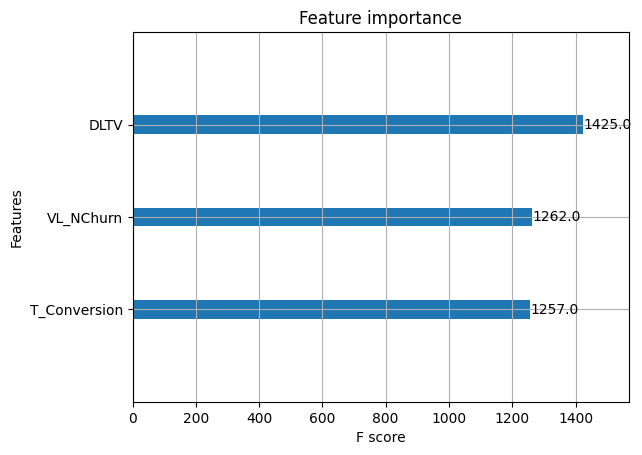

In [25]:
graficar(df_segmentado, model_cols)
graficar_importancia(df_segmentado, model_cols)

#### Caracterizar Segmentos

In [16]:
# suppress scientific notation by setting float_format
pd.options.display.float_format = '{:.2f}'.format
# Mostrar estadísticas de los clusters
df_segmentado[model_cols+['cluster']].groupby('cluster').describe().T

cluster                        0          1          2          3          4
DLTV             count  13850.00     881.00    5218.00     593.00    2299.00
                 mean  344646.11  670359.42 1274611.73  992081.42  638533.26
                 std   194479.95  528205.06  332842.94  534288.81  382719.12
                 min    10114.55   33305.11  801040.39   44695.73   17715.27
                 25%   189498.43  237486.25  949251.68  562496.64  353810.91
                 50%   300758.51  496981.32 1204231.32  946007.82  567604.69
                 75%   518816.54 1056505.01 1510294.24 1380152.02  845456.58
                 max   810660.63 2036851.85 2036757.57 2028848.31 1930289.33
T_Conversion     count  13850.00     881.00    5218.00     593.00    2299.00
                 mean      64.40     274.96     104.50    3274.83    1457.22
                 std      137.44     625.59     258.73     701.98     427.33
                 min     -318.00    -426.00    -318.00    2030.00     638.00
                 25%        9.00       6.00       9.00    2782.00    1096.50
                 50%       22.00      22.00      23.00    3131.00    1428.00
                 75%       45.00      74.00      45.00    3767.00    1727.00
                 max      923.00    3774.00    1755.00    6492.00    2649.00
Canales_Donacion count  13850.00     881.00    5218.00     593.00    2299.00
                 mean       1.00       2.02       1.00       1.03       1.00
                 std        0.00       0.14       0.00       0.16       0.00
                 min        1.00       2.00       1.00       1.00       1.00
                 25%        1.00       2.00       1.00       1.00       1.00
                 50%        1.00       2.00       1.00       1.00       1.00
                 75%        1.00       2.00       1.00       1.00       1.00
                 max        1.00       3.00       1.00       2.00       1.00

In [8]:
# suppress scientific notation by setting float_format
pd.options.display.float_format = '{:.2f}'.format

donaciones_sin_outlier['Prom_Cuotas_Pagadas'].describe()

count   22849.00
mean       -0.00
std         1.00
min        -1.52
25%        -0.59
50%        -0.10
75%         0.27
max        22.00
Name: Prom_Cuotas_Pagadas, dtype: float64

In [23]:
df_donantes['DT_Primer_Cobro'].value_counts()

2015-01-31    943
2022-04-01    303
2022-08-01    294
2022-11-01    291
2022-12-01    289
             ... 
2019-08-03      1
2021-04-10      1
2021-08-07      1
2021-08-14      1
2023-05-21      1
Name: DT_Primer_Cobro, Length: 1727, dtype: int64

In [14]:
df_donantes[df_donantes['Prom_Cuotas_Pagadas']==132][['ID_Donante', 'DT_Captacion', 'DT_Primer_Cobro', 'Prom_Cuotas_Pagadas', 'Prom_Cuotas_No_Pagadas', 'VL_NChurn']]

,ID_Donante,DT_Captacion,DT_Primer_Cobro,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,VL_NChurn
28838,1020062913,2010-05-10,2023-01-05,132.00,78.00,0.26


In [15]:
df_transacciones[df_transacciones['FK_ID_Donante']==1020062913]

,FK_ID_Donante,FK_CD_Etapa,DT_Fecha,VL_Importe,FK_CD_Canal_campana,FK_CD_Registro,FK_CD_Medio_Pago,FK_CD_Compromiso,DT_Registro_Contable,DT_Primer_Cobro,DT_Ultima_Donacion,FK_CD_Estado,Mes_Donacion,Anio_Donacion,Ant_Primer_Transaccion
1219794,1020062913,Cobrada,2023-07-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-07-04,2023-01-05,2023-07-02,Abierto,7,2023,0
1241561,1020062913,Cobrada,2023-01-05,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-01-06,2023-01-05,2023-07-02,Abierto,1,2023,0
1241572,1020062913,Cobrada,2023-02-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-02-01,2023-01-05,2023-07-02,Abierto,2,2023,0
1241583,1020062913,Cobrada,2023-03-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-03-01,2023-01-05,2023-07-02,Abierto,3,2023,0
1241594,1020062913,Cobrada,2023-04-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-04-05,2023-01-05,2023-07-02,Abierto,4,2023,0
1241605,1020062913,Cobrada,2023-05-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-05-05,2023-01-05,2023-07-02,Abierto,5,2023,0
1241616,1020062913,Cobrada,2023-06-02,20000.00,Multicanal,DI - Regular,Débito Automático,Nuevo por cambio de datos clave,2023-06-01,2023-01-05,2023-07-02,Abierto,6,2023,0


In [9]:
total_trans = pd.read_csv('./Archivos_Cliente/Transacciones_Individuales.csv', sep=';', encoding='latin-1')
total_trans.head()

,PSN,Etapa,Fecha de Donación,Importe,Canal de la Campaña,Tipo de registro,Medio de Pago,Tipo de Compromiso,Fecha de Registro Contable,Fecha efectiva de primer cobro,Fecha de última donación,Estado/Tipo
0,1020449841,Perdida,18/01/2021,"30000,00",Click to Call,DI - Regular,Débito Automático,Primer Compromiso,NaN,18/08/2020,10/10/2021,Abierto
1,1020019970,Cobrada,1/02/2021,"15000,00",Multicanal,DI - Regular,Débito Automático,Primer Compromiso,1/02/2021,30/11/2015,1/07/2023,Abierto
2,1020355747,Perdida,27/02/2021,"20000,00",F2F,DI - Regular,Débito Automático,Primer Compromiso,NaN,27/02/2017,9/11/2021,Abierto
3,1020142210,Perdida,1/01/2021,"50000,00",F2F,PI - Padrinazgo individual,Débito Automático,Primer Compromiso,NaN,31/01/2015,NaN,Abierto
4,1020117113,Cobrada,1/01/2021,"30000,00",F2F,DI - Regular,Débito Automático,Primer Compromiso,4/01/2021,31/01/2015,1/01/2022,Cerrado


In [10]:
efect_cobro = total_trans.pivot_table(index='PSN', columns='Etapa', values='Importe', aggfunc='count').fillna(0)
efect_cobro['Total_transacciones'] = efect_cobro.apply(lambda x: np.sum(x), axis=1)
efect_cobro['Efectividad_cobro'] = efect_cobro['Cobrada']/efect_cobro['Total_transacciones']
efect_cobro.reset_index(inplace=True)
efect_cobro.rename(columns={'PSN':'ID_Donante', 'Cobrada': 'Trans_Cobradas'}, inplace=True)
efect_cobro.head()

Etapa,ID_Donante,Trans_Cobradas,Comprometida,Eliminar,Enviada a cobrar,Perdida,Rechazada,Total_transacciones,Efectividad_cobro
0,1020000012,28.0,4.0,0.0,1.0,6.0,0.0,39.0,0.717949
1,1020000020,0.0,6.0,0.0,0.0,31.0,0.0,37.0,0.000000
2,1020000038,31.0,4.0,0.0,0.0,1.0,0.0,36.0,0.861111
3,1020000061,0.0,5.0,0.0,0.0,32.0,0.0,37.0,0.000000
4,1020000079,31.0,5.0,0.0,1.0,0.0,0.0,37.0,0.837838


In [11]:
df_donantes = df_donantes.merge(efect_cobro[['ID_Donante', 'Trans_Cobradas', 'Total_transacciones', 'Efectividad_cobro']], on='ID_Donante', how='left')

In [12]:
lfv = lfv.merge(efect_cobro[['ID_Donante', 'Trans_Cobradas', 'Total_transacciones', 'Efectividad_cobro']], on='ID_Donante', how='left')

#### Quitar Outliers

In [13]:
# Calcular el rango IQR para la variable DLTV
donaciones_sin_outlier, outliers = calcular_outliers(lfv, 'DLTV')
donaciones_sin_outlier.head()

Se encontraron 1293 outliers en la variable DLTV con un límite inferior de -834150.2522626003 y un límite superior de 2030440.2688611895
Se analizará una base con 22902 registros


,ID_Donante,Valor_Total,Anio_Donacion,VL_Lifespan,VL_Edad,VL_NChurn,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,Ant_Primer_Transaccion,Total_Anual,DLTV,T_Conversion,FK_ID_Genero,FK_ID_Estado_Civil,Canales_Donacion,Canal_Principal,Trans_Cobradas,Total_transacciones,Efectividad_cobro
1,1020000038,1.689828e+06,2021,4.545455,19,0.2200,24.333333,4.000000,2,563275.901847,1.685644e+06,3129,Femenino,0,1,DI - Regular,31.0,36.0,0.861111
3,1020000087,1.005497e+06,2021,7.142857,67,0.1400,34.000000,4.166667,2,335165.603701,1.495850e+06,2794,Masculino,0,1,DI - Regular,31.0,36.0,0.861111
4,1020000095,2.231845e+06,2021,1.670844,49,0.5985,26.750000,20.000000,2,743948.331844,6.600637e+05,5814,Femenino,Casado,1,PI - Padrinazgo individual,25.0,31.0,0.806452
5,1020000152,4.789785e+05,2021,1.715266,71,0.5830,19.333333,2.111111,2,159659.492776,1.416569e+05,1727,Femenino,Soltero,1,DI - Regular,14.0,19.0,0.736842
6,1020000160,5.234709e+05,2021,4.347826,75,0.2300,25.555556,2.555556,2,174490.312221,5.221749e+05,1727,Femenino,0,1,DI - Regular,32.0,37.0,0.864865


#### Definición de variables a utilizar

In [53]:
# Variables a evaluar
model_cols = ['VL_Edad', 'Trans_Cobradas', 'Efectividad_cobro', 'Canales_Donacion', 'DLTV', 'VL_NChurn']

#### PCA

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_7764\4181020671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  donaciones_sin_outlier[model_cols] = scaler.transform(donaciones_sin_outlier[model_cols])


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


,VL_Edad,Trans_Cobradas,Efectividad_cobro,Canales_Donacion,DLTV,VL_NChurn
PC1,0.33,0.64,0.62,0.01,0.28,-0.16
PC2,-0.12,-0.20,-0.21,-0.01,0.65,-0.69
PC3,-0.27,0.03,0.08,0.96,0.04,0.04


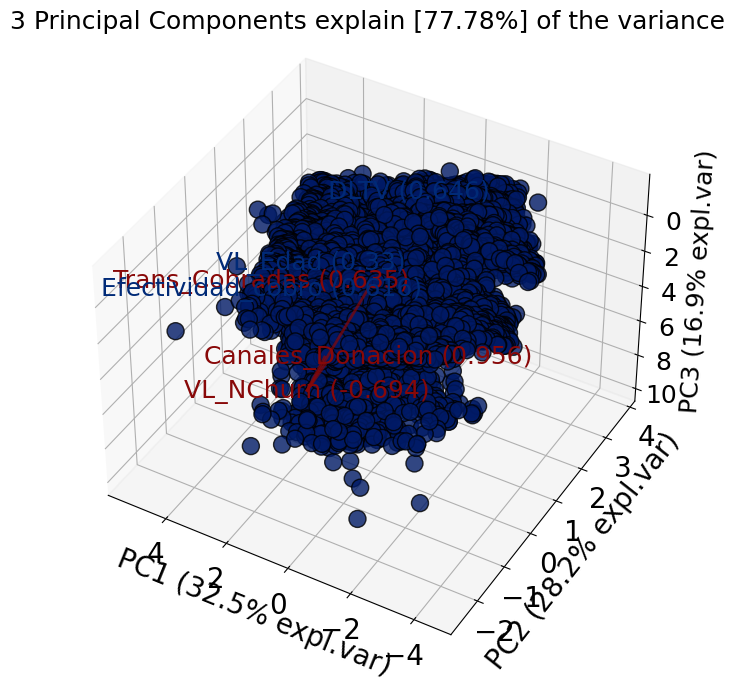

In [46]:
# Estandarizar variables
scaler = StandardScaler()
scaler.fit(donaciones_sin_outlier[model_cols])
donaciones_sin_outlier[model_cols] = scaler.transform(donaciones_sin_outlier[model_cols])

# Inicializar objeto PCA
pca_model = pca(n_components=3)
pca_donantes = pca_model.fit_transform(donaciones_sin_outlier[model_cols])

# Creamos el biplot
fig, ax = pca_model.biplot3d(n_feat=8, legend=False, figsize=(8,8))

display(pca_donantes['loadings'])

#### K-Means

El mejor número de clusters es:  5


C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_1460\3711989484.py:95: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ZU956KH\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but KMeans was fitted without feature names

C:\Users\ZU956KH\AppData\Local\Temp\ipykernel_1460\529547174.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



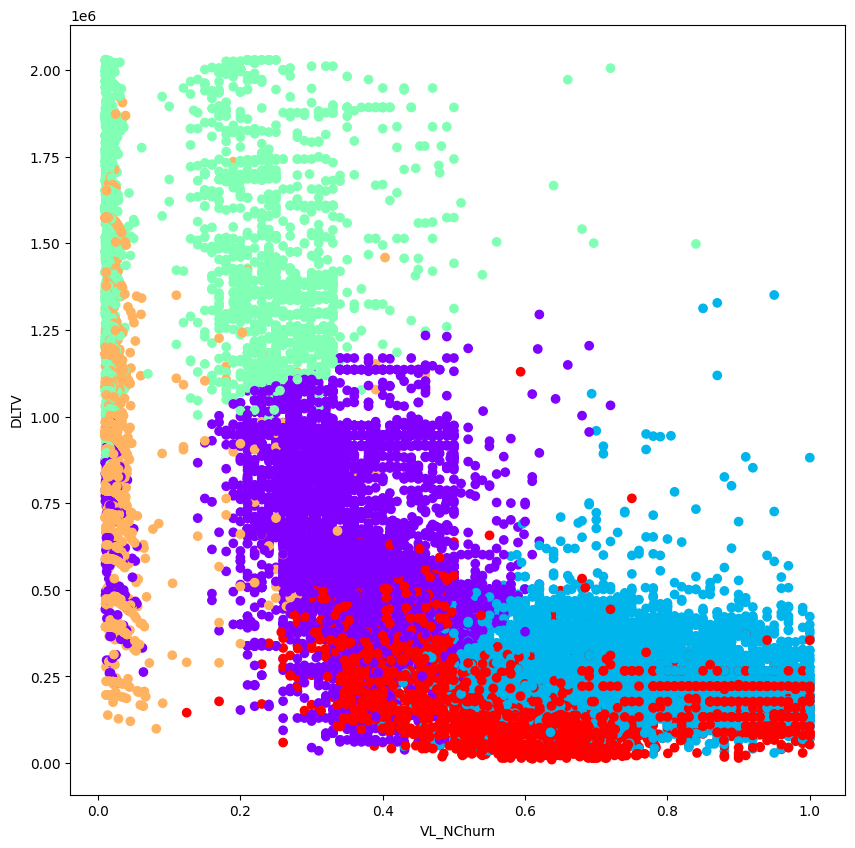

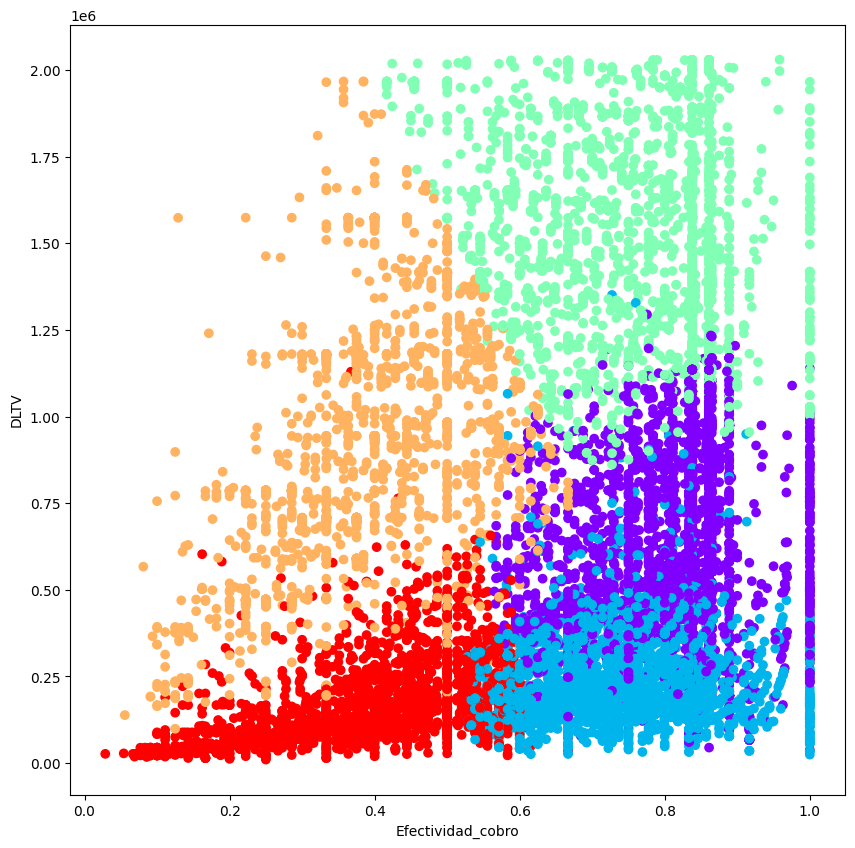

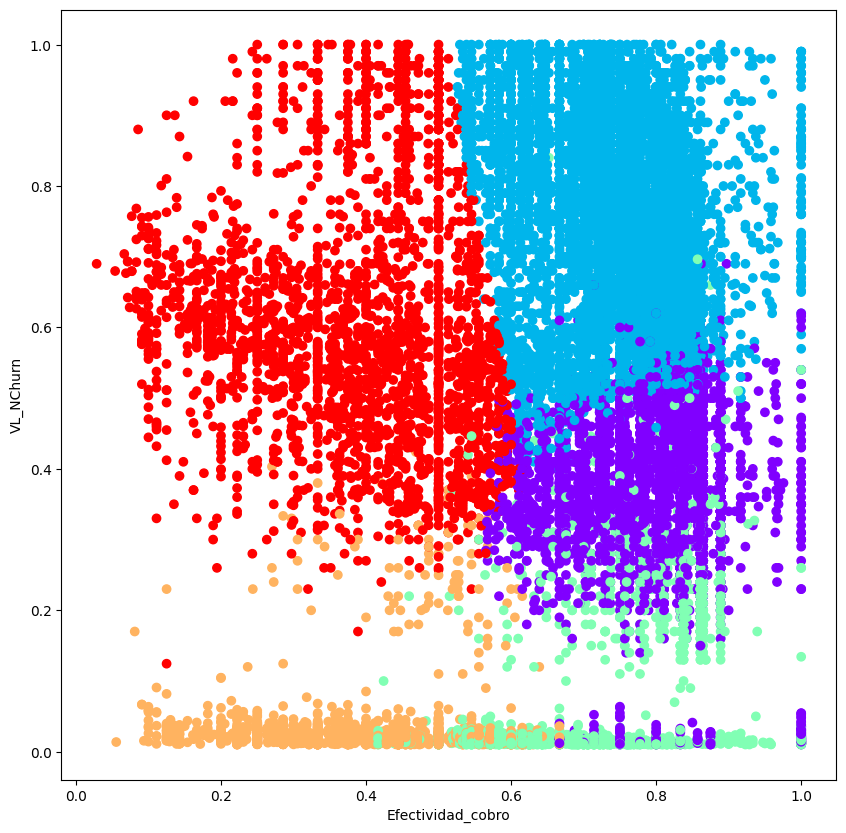

In [14]:
model_cols = ['DLTV', 'VL_NChurn', 'Efectividad_cobro']
# Obtener mejor k means
best_k = obtener_mejor_k(donaciones_sin_outlier[model_cols])
# Obtener clusters
df_segmentado, kmeans_model = obtener_clusters(donaciones_sin_outlier, model_cols, best_k)
# Agregar clasificación de outliers al df de outliers
outliers['cluster'] = kmeans_model.predict(outliers[model_cols])
# Agregar outliers al df_segmentado
df_segmentado_con_outliers = pd.concat([df_segmentado, outliers])
# Graficar
graficar(df_segmentado,model_cols)
graficar(df_segmentado, ['DLTV', 'VL_NChurn'])
graficar(df_segmentado, ['DLTV', 'Efectividad_cobro'])
graficar(df_segmentado, ['VL_NChurn', 'Efectividad_cobro'])

In [16]:
df_cancelados = pd.read_csv('./Archivos_Cliente/Base_inactivos_lfv.csv', encoding='latin-1')
df_cancelados.head()

,ID_Donante,Valor_Total,Anio_Donacion,VL_Lifespan,VL_Edad,VL_NChurn,Prom_Cuotas_Pagadas,Prom_Cuotas_No_Pagadas,Ant_Primer_Transaccion,Total_Anual,DLTV,Trans_Cobradas,Total_transacciones,Efectividad_cobro
0,1020000509,383750.0822,2021,1.902,24,0.5259,19.444444,3.444444,2,127916.6941,113493.3151,17,37,0.459459
1,1020000681,507225.3111,2021,1.087,76,0.9200,10.400000,0.800000,2,169075.1037,150010.8657,3,6,0.500000
2,1020001382,773896.6233,2021,3.846,67,0.2600,26.000000,3.800000,2,257965.5411,612122.8006,23,23,1.000000
3,1020001598,339689.7489,2021,1.352,54,0.7399,25.666667,8.166667,2,113229.9163,100462.5601,15,36,0.416667
4,1020003313,247839.3750,2022,1.571,60,0.6365,25.500000,6.666667,1,123919.6875,109946.9951,2,37,0.054054


In [18]:
df_cancelados['cluster'] = kmeans_model.predict(df_cancelados[model_cols])

C:\Users\ZU956KH\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but KMeans was fitted without feature names



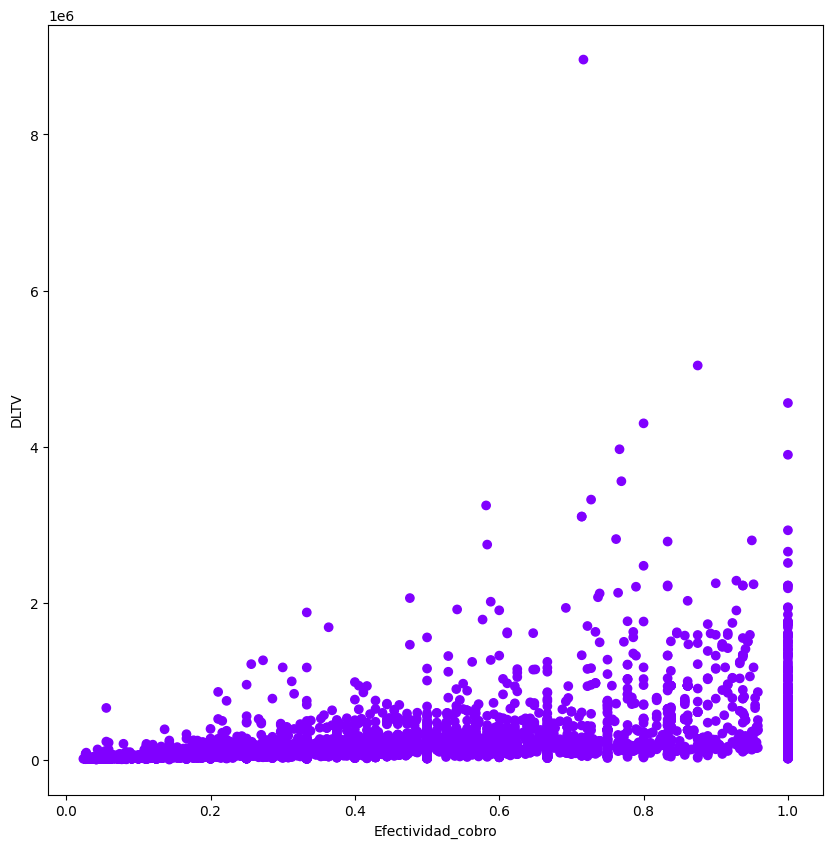

In [20]:
graficar(df_cancelados, ['DLTV', 'Efectividad_cobro'])

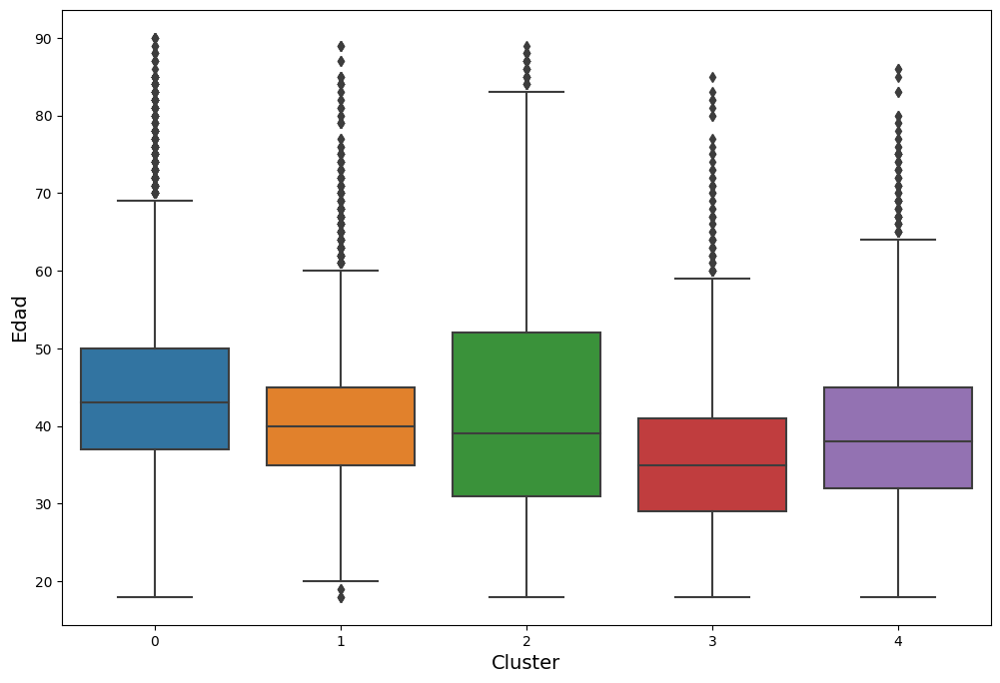

In [21]:
import seaborn as sns
# Boxplot de edad por cluster
fig, ax = plt.subplots(figsize=(12, 8))
sns.boxplot(x='cluster', y='VL_Edad', data=df_segmentado_con_outliers)
ax.set_xlabel('Cluster', fontsize=14)
ax.set_ylabel('Edad', fontsize=14)
plt.show()

In [25]:
# suppress scientific notation by setting float_format
pd.options.display.float_format = '{:.2f}'.format
# Mostrar estadísticas de los clusters
df_segmentado[model_cols+['cluster', 'VL_Edad']].groupby('cluster').describe().T

cluster                          0          1          2          3          4
DLTV              count    8394.00    6372.00    3283.00    2237.00    2616.00
                  mean   603755.02  246054.71 1496796.86  935360.52  171347.45
                  std    229463.17  105253.86  273165.50  338601.77  117163.53
                  min     35458.91   24432.67  861415.76   99073.18   10114.55
                  25%    434845.73  180276.57 1313557.81  707975.93   86908.86
                  50%    567604.69  225097.01 1445685.64  943893.10  137350.17
                  75%    801953.67  300758.51 1699266.73 1178852.29  230854.91
                  max   1294398.59 1350582.06 2029838.32 1966954.89 1129175.02
VL_NChurn         count    8394.00    6372.00    3283.00    2237.00    2616.00
                  mean        0.35       0.74       0.13       0.03       0.60
                  std         0.09       0.14       0.13       0.05       0.17
                  min         0.01       0.40       0.01       0.01       0.12
                  25%         0.31       0.62       0.01       0.01       0.48
                  50%         0.35       0.74       0.02       0.02       0.58
                  75%         0.40       0.85       0.25       0.03       0.69
                  max         0.72       1.00       0.84       0.49       1.00
Efectividad_cobro count    8394.00    6372.00    3283.00    2237.00    2616.00
                  mean        0.83       0.75       0.75       0.41       0.39
                  std         0.06       0.09       0.12       0.12       0.13
                  min         0.57       0.53       0.42       0.06       0.03
                  25%         0.82       0.68       0.67       0.33       0.30
                  50%         0.84       0.75       0.77       0.40       0.41
                  75%         0.86       0.81       0.84       0.50       0.50
                  max         1.00       1.00       1.00       0.67       0.62
VL_Edad           count    8394.00    6372.00    3283.00    2237.00    2616.00
                  mean       44.76      41.11      42.56      36.33      39.73
                  std        11.72       9.38      14.34       9.87      11.13
                  min        18.00      18.00      18.00      18.00      18.00
                  25%        37.00      35.00      32.00      29.00      32.00
                  50%        43.00      40.00      40.00      35.00      38.00
                  75%        50.00      45.00      51.00      41.00      45.00
                  max        90.00      89.00      89.00      85.00      86.00

In [24]:
df_donantes.columns

Index(['ID_Donante', 'CD_Tipo_Registro', 'DT_Nacimiento',
       'DT_Aniversario_Pago', 'VL_Edad', 'DT_Captacion', 'Monto Actual',
       'FK_ID_Genero', 'FK_ID_Estado_Civil', 'VL_Num_Hijos', 'CD_Tiene_Hijos',
       'FK_ID_Ocupacion', 'VL_Churn_Prob', 'VL_Lapsed_Prob',
       'RFM Segmento Actual', 'FK_ID_Segmento_RFM', 'VL_Cuotas_Pagadas',
       'VL_Cuotas_No_Pagadas', 'FK_ID_Campana', 'CD_Donante_Activo',
       'CD_Departamento', 'CD_Ciudad', 'VL_NChurn', 'VL_Lifespan',
       'DT_Primer_Cobro', 'Prom_Cuotas_Pagadas', 'Prom_Cuotas_No_Pagadas',
       'T_Conversion', 'Trans_Cobradas', 'Total_transacciones',
       'Efectividad_cobro'],
      dtype='object')